**Рынок заведений общественного питания Москвы**  
  
**Краткое описание** - Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  

**Цель** - исследовать рынок Москвы, найти интересные особенности и подготовить презентацию с результатами исследования.  

**Ход исследования**  

Данные для исследования находятся датасете:
'moscow_places.csv' - здесь находится вся информация с заведениями общественного питания Москвы

Описание данных

- name — название заведения;  
- address — адрес заведения;  
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
- hours — информация о днях и часах работы;  
- lat — широта географической точки, в которой находится заведение;  
- lng — долгота географической точки, в которой находится заведение;  
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
    «Средний счёт: 1000–1500 ₽»;  
    «Цена чашки капучино: 130–220 ₽»;  
    «Цена бокала пива: 400–600 ₽».  
    и так далее;  
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);  
- district — административный район, в котором находится заведение, например Центральный административный округ;  
- seats — количество посадочных мест.  


В рамках исследования нужно будет изучить представленные данные и провести предобработку. Далее необходимо будет провести анализ данных с исследованием категорий заведения, количеством посадочных мест, районов Москвы, средних чеков и т.д. Необходимо будет все визуализировать. В ходе анализа проведем детализацию и выделим отдельную категорию  кофейню. В рамках детализации ответим на следующие вопросы:  
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?  
- Есть ли круглосуточные кофейни?  
- Какие у кофеен рейтинги? Как они распределяются по районам?  
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  
В конечном итоге нужно подготовить презентацию исследования для инвесторов.  

**Таким образом, исследование пройдёт в 4 этапа:**

1) Подготовка данных.  
2) Анализ данных/Проведение самого исследования  
3) Анализ бизнес идеи по открытию кофейни  
4) Подготовка презентации.


In [ ]:
# импортирую необходимые библиотеки
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats as st
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

In [ ]:
path = '/datasets/'
data = pd.read_csv(path + 'moscow_places.csv')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Посмотрел общую информацию по датасету, каждый столбец соответсвует своему типу данных. Но я вижу что присутствуют пропуски. К ним я перейду чуть позже.

### Предобработка данных

In [ ]:
pd.options.display.max_rows = 10

In [ ]:
data['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Моспончики            1
Ресторан Купец        1
Алия кафе             1
Ситипицца             1
Домик в Саду          1
Name: name, Length: 5614, dtype: int64

Мы посмотрели какие заведения и сколько представлены. Очень много заведений по одному и есть подозрения по дубликатам (неявным и явным). Сейчас посмотрим информацию по столбцу и после уже перейдем к предобработке.

In [ ]:
data['name'].describe()

count     8406
unique    5614
top       Кафе
freq       189
Name: name, dtype: object

In [ ]:
# я бы в этом столбце для начала предобработки привел все к нижнему регистру.
data['name'] = data['name'].str.lower()

In [ ]:
data['name'].value_counts()

кафе                189
шоколадница         120
домино'с пицца       77
додо пицца           74
one price coffee     72
                   ... 
cosmos lounge         1
ала арча              1
tomorrow              1
хинкали gали!         1
кафе электрон         1
Name: name, Length: 5512, dtype: int64

In [ ]:
pd.options.display.max_rows = 50
data['name'].value_counts().head(50)
#data['name'].value_counts().tail(50)

кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
буханка                                 32
cofefest                                32
столовая                                28
му-му                                   27
drive café                              24
кофемания                               23
андерсон                                22
крошка картошка                         22
french bake

После приведения к нижнему регистру названия кафе объединились (102), и после вывода строк при визуальном осмотре одинаковых названий с использованием символов не обнаружено. Я перехожу к другим столбцам.

In [ ]:
data['category'].describe()

count     8406
unique       8
top       кафе
freq      2378
Name: category, dtype: object

In [ ]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Не вижу никаких проблем с данными в этом столбце. Идем дальше. 

In [ ]:
data['address'].describe()

count                                  8406
unique                                 5753
top       Москва, проспект Вернадского, 86В
freq                                     28
Name: address, dtype: object

In [ ]:
data['address'].value_counts()

Москва, проспект Вернадского, 86В        28
Москва, Усачёва улица, 26                26
Москва, площадь Киевского Вокзала, 2     20
Москва, Ярцевская улица, 19              20
Москва, Лесная улица, 20, стр. 3         16
                                         ..
Москва, Зеленодольская улица, 43А         1
Москва, улица Земляной Вал, 14-16с1       1
Москва, улица Новый Арбат, 11, стр. 2     1
Москва, Никольская улица, 8               1
Москва, улица Арбат, 31                   1
Name: address, Length: 5753, dtype: int64

На первый взгляд проблем нет, интересно что на нескольких адресах много кафе присутсвует. Я посмотрел по карте, на проспекте Вернадского находится фудмолл , на улице Усачева - Усачевский рынок. Вероятно и остальные тоже здания где много кафе это или рынки или торговые центры. Так как в этом столбце текст я приведу на всякий случай к нижнему регистру по аналогии с названиями, чтобы в случае чего также схлопнуть дубли.

In [ ]:
data['address'].str.lower()
data['address'].value_counts()

Москва, проспект Вернадского, 86В        28
Москва, Усачёва улица, 26                26
Москва, площадь Киевского Вокзала, 2     20
Москва, Ярцевская улица, 19              20
Москва, Лесная улица, 20, стр. 3         16
                                         ..
Москва, Зеленодольская улица, 43А         1
Москва, улица Земляной Вал, 14-16с1       1
Москва, улица Новый Арбат, 11, стр. 2     1
Москва, Никольская улица, 8               1
Москва, улица Арбат, 31                   1
Name: address, Length: 5753, dtype: int64

In [ ]:
data['district'].describe()

count                                   8406
unique                                     9
top       Центральный административный округ
freq                                    2242
Name: district, dtype: object

In [ ]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

К этому столбцу тоже нет вопросов.

In [ ]:
data['hours'].describe()

count                       7870
unique                      1307
top       ежедневно, 10:00–22:00
freq                         759
Name: hours, dtype: object

In [ ]:
data['hours'].value_counts().head(50)

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
ежедневно, 09:00–21:00                                  204
ежедневно, 09:00–22:00                                  184
ежедневно, 12:00–23:00                                  178
ежедневно, 08:00–23:00                                  160
ежедневно, 08:00–22:00                                  148
ежедневно, 09:00–23:00                                  140
ежедневно, 11:00–00:00                                  127
ежедневно, 10:00–21:00                                  103
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00     89
ежедневно, 10:00–00:00                                   79
ежедневно, 08:00–21:00                                   73
пн-пт 08:00–19:00                       

In [ ]:
data['hours'].isna().mean()

0.06376397811087318

In [ ]:
# в этом столбце у нас 6% пропусков, так как у нас не повлияют они на исследование, я заполню пустые строки 'unknown'
data['hours'] = data['hours'].fillna('unknown')

In [ ]:
data['lat'].value_counts()

55.805361    3
55.762784    3
55.783477    3
55.746918    3
55.706883    3
            ..
55.761960    1
55.792516    1
55.770445    1
55.761305    1
55.726613    1
Name: lat, Length: 8209, dtype: int64

In [ ]:
data['lat'].isna().mean()

0.0

In [ ]:
data['lng'].value_counts()

37.732745    3
37.653027    3
37.574534    3
37.552480    3
37.513952    3
            ..
37.593804    1
37.671945    1
37.613680    1
37.659817    1
37.667622    1
Name: lng, Length: 8258, dtype: int64

In [ ]:
data['lng'].isna().mean()

0.0

По столбцам 'lat' и 'lng' главное что нет пропусков и вопросов тоже не имею.

In [ ]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [ ]:
data['rating'].value_counts()

4.3    1513
4.4    1351
4.2    1041
4.1     785
4.5     623
4.0     499
4.7     440
4.6     422
3.9     252
4.9     243
4.8     215
3.8     188
3.7     147
5.0     105
3.6      76
3.5      72
3.4      68
3.3      54
3.2      41
3.1      37
2.9      31
2.8      30
3.0      24
2.6      15
1.1      14
2.5      14
2.3      14
2.2      13
2.4      11
2.7      11
1.3      11
1.4      11
1.0      10
1.7       6
2.1       4
2.0       4
1.9       4
1.6       2
1.8       2
1.5       2
1.2       1
Name: rating, dtype: int64

In [ ]:
data['rating'].isna().mean()

0.0

По этому столбцу тоже данные в порядке

In [ ]:
data['price'].describe()

count        3315
unique          4
top       средние
freq         2117
Name: price, dtype: object

In [ ]:
data['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [ ]:
data['price'].isna().mean()

0.605638829407566

В этом столбце очень много пропусков (60%). Но по причине того, что данные не будут использоваться в исследовании, я не буду тратить время на замену пропусков. Равно как и со столбцом 'avg_bill' по этим же причинам. 

In [ ]:
data['avg_bill'].describe()

count                         3816
unique                         897
top       Средний счёт:1000–1500 ₽
freq                           241
Name: avg_bill, dtype: object

In [ ]:
data['avg_bill'].value_counts()

Средний счёт:1000–1500 ₽      241
Средний счёт:1500–2000 ₽      120
Средний счёт:300–500 ₽         90
Средний счёт:500–1000 ₽        78
Средний счёт:1500–2500 ₽       68
                             ... 
Цена бокала пива:320–375 ₽      1
Средний счёт:229 ₽              1
Цена бокала пива:200–390 ₽      1
Средний счёт:280–320 ₽          1
Средний счёт:400–1500 ₽         1
Name: avg_bill, Length: 897, dtype: int64

In [ ]:
data['avg_bill'].isna().mean()

0.5460385438972163

In [ ]:
# а вот со столбцами 'middle_avg_bill' и 'middle_coffee_cup' нужно будет поработать.
data['middle_avg_bill'].value_counts()

1250.0    247
1000.0    175
300.0     148
1500.0    146
400.0     134
         ... 
545.0       1
6000.0      1
345.0       1
1060.0      1
30.0        1
Name: middle_avg_bill, Length: 230, dtype: int64

In [ ]:
data['middle_avg_bill'].isna().mean()

0.62538662859862

In [ ]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

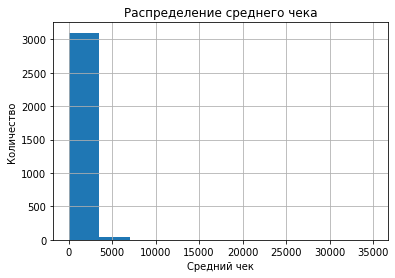

In [ ]:
data['middle_avg_bill'].hist()
plt.xlabel('Средний чек')
plt.ylabel('Количество')
plt.title('Распределение среднего чека');

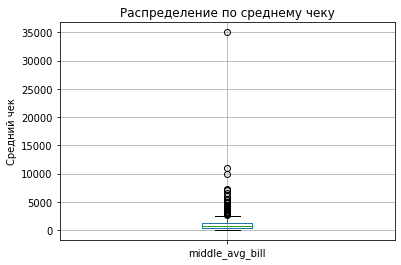

In [ ]:
data.boxplot(column=['middle_avg_bill'])
plt.ylabel('Средний чек')
plt.title('Распределение по среднему чеку');
plt.show()

In [ ]:
# в столбце middle_avg_bill я не буду ничего менять, по причине того, что пропусков больше половины, 
# и в последующем исследовании у нас будут не корректные выводы . Принято решение оставить все как есть.

In [ ]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [ ]:
data['middle_coffee_cup'].isna().mean()

0.9363549845348561

In [ ]:
(data['category'] == 'кофейня').value_counts()

False    6993
True     1413
Name: category, dtype: int64

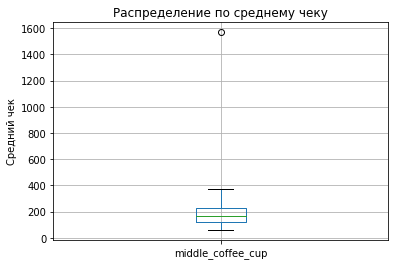

In [ ]:
data.boxplot(column=['middle_coffee_cup'])
plt.ylabel('Средний чек')
plt.title('Распределение по среднему чеку');
plt.show()

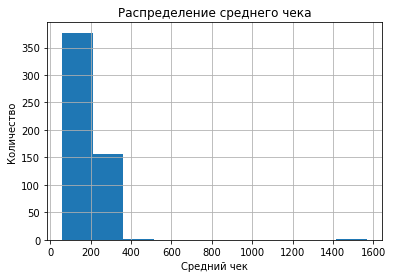

In [ ]:
data['middle_coffee_cup'].hist()
plt.xlabel('Средний чек')
plt.ylabel('Количество')
plt.title('Распределение среднего чека');

In [ ]:
# тут схожая ситуация как и в столбце с числом оценки среднего чека. Только пропусков намного больше (93%). 
# Я это объясняю тем, что кофеен не так много, но лучше я также оставлю все как есть без изменений.

In [ ]:
# посмотрим что у нас с ситуацией по сетевым и не сетевым заведениям. 
data['chain'].describe()

count    8406.000000
mean        0.381275
std         0.485729
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: chain, dtype: float64

In [ ]:
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

In [ ]:
data['chain'].isna().mean()

0.0

In [ ]:
# для более удобного восприятия я переименую значения на "сетевое" и "несетевое"
data['chain'] = data['chain'].map({0 :'несетевое', 1 :'сетевое'})

К столбцу 'Chain' вопросов нет. Посмотрим наконец на последний с местами 'seats'.

In [ ]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [ ]:
data['seats'].isna().mean()

0.4295741137282893

In [ ]:
data.sort_values(by='seats').head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5578,мангал,быстрое питание,"Москва, Саянская улица, 11А",Восточный административный округ,"ежедневно, круглосуточно",55.767800,37.833233,4.2,NaN,NaN,NaN,NaN,сетевое,0.0
7271,вьет лотос,быстрое питание,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649476,37.771455,4.6,NaN,NaN,NaN,NaN,несетевое,0.0
7267,выдра кофе,кофейня,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.650092,37.769662,5.0,NaN,NaN,NaN,NaN,несетевое,0.0
7266,шашлыкоff,"бар,паб","Москва, Поречная улица, 10",Юго-Восточный административный округ,"пн-чт 10:00–00:00; пт,сб 10:00–03:00; вс 10:00...",55.650440,37.769901,4.4,средние,Средний счёт:500–700 ₽,600.0,NaN,сетевое,0.0
7259,пицца паоло,пиццерия,"Москва, Коломенская улица, 19, корп. 2",Южный административный округ,вт-вс 10:30–22:00,55.678245,37.695932,3.7,средние,Средний счёт:300–500 ₽,400.0,NaN,сетевое,0.0
2823,шаверма,быстрое питание,"Москва, Уссурийская улица, 1, корп. 5",Восточный административный округ,"ежедневно, 09:00–22:00",55.823564,37.810661,3.0,NaN,NaN,NaN,NaN,сетевое,0.0
2906,кофе с собой,кафе,"Москва, Сиреневый бульвар, 64А",Восточный административный округ,"ежедневно, круглосуточно",55.802933,37.829503,3.5,NaN,Средний счёт:90–450 ₽,270.0,NaN,сетевое,0.0
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,несетевое,0.0
7241,яндекс лавка,ресторан,"Москва, Варшавское шоссе, 59А",Южный административный округ,"ежедневно, 07:00–02:00",55.675595,37.627051,4.0,NaN,NaN,NaN,NaN,сетевое,0.0
2973,шаурма,кафе,"Москва, бульвар Маршала Рокоссовского, 36/1",Восточный административный округ,"ежедневно, 08:00–22:00",55.817703,37.714289,3.8,NaN,NaN,NaN,NaN,несетевое,0.0


Есть теория, что пропуски в столбце 'seats' обозначают скорее отсуствие впринципе сидячих мест в заведении. Если посмотреть выше на таблицу, то в основном это заведения быстрого питания либо может быть едой на вынос. Посмотрим на распределение

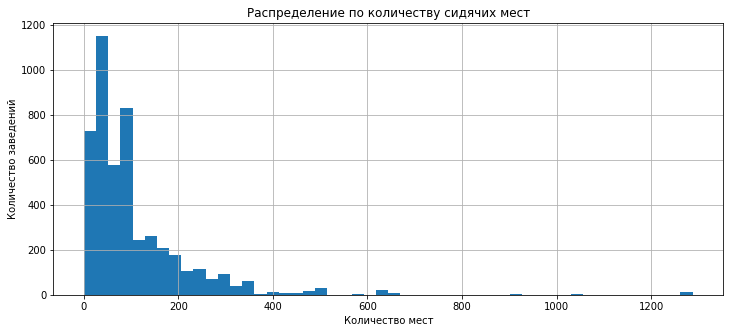

In [ ]:
data['seats'].hist(figsize=(12,5), bins=50)
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.title('Распределение по количеству сидячих мест');

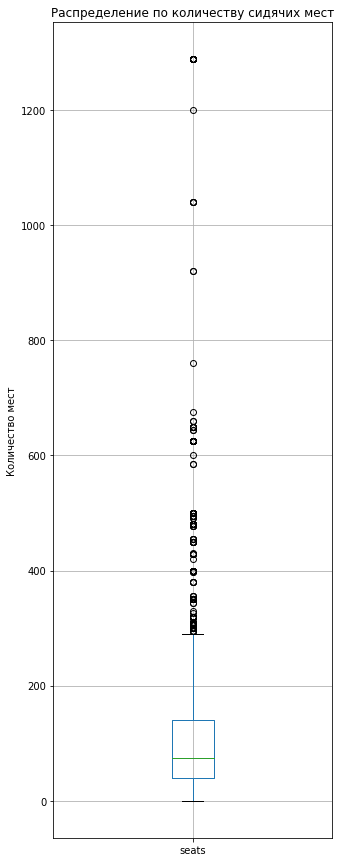

In [ ]:
plt.figure(figsize=(5,15))
data.boxplot(column=['seats'])
plt.ylabel('Количество мест')
plt.title('Распределение по количеству сидячих мест');
plt.show()

In [ ]:
data[data['seats'].isna()].head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,несетевое,NaN
11,шашлык шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,несетевое,NaN
12,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,несетевое,NaN
14,у сильвы,"бар,паб","Москва, Ангарская улица, 42с1",Северный административный округ,"ежедневно, 13:00–00:00",55.885528,37.528371,4.2,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,несетевое,NaN
16,база стритфуд,кафе,"Москва, Базовская улица, 15, корп. 8",Северный административный округ,"ежедневно, 10:00–23:00",55.877859,37.507754,4.2,средние,Средний счёт:140–350 ₽,245.0,NaN,несетевое,NaN
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,сетевое,NaN
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевое,NaN
22,крымские чебуреки,кафе,"Москва, Коровинское шоссе, 35, стр. 17",Северный административный округ,пн-пт 09:00–21:00,55.883414,37.514572,4.2,NaN,NaN,NaN,NaN,несетевое,NaN


Судя по типам заведений и наименований, я думаю, что пропущены значения как и написал выше в заведениях без сидячих мест, быстрого питания либо работающих на доставку. 
Я предлагаю пропуски все заменить цифрой - 0. Чтобы все ячейки были заполнены. И после этого столбец будет готов. 

In [ ]:
data['seats'] = data['seats'].fillna(0)

Таким образом мы просмотрели все столбцы, по типу данных нет замечаний, их оставляем как есть, были пропуски в нескольких столбцах, мы их обработали, и почти подготовили к анализу. Сейчас посмотрим по наличию дубликатов и перейдем к анализу. 

In [ ]:
data.duplicated().sum() 

0

Итого явных дубликатов не обнаружено. Неявные могут скрываться в столбце с названиями (как я писал выше), но строк слишком много для их поиска и я выбираю съэкономить время, оставив все как есть. Сейчас пеерйдем к созданию столбцов, завершив окончательно предобработку.

In [ ]:
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])
data.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,0.0,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,0.0,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,Правобережная улица
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,несетевое,0.0,Ижорская улица
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,несетевое,45.0,Клязьминская улица
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,несетевое,45.0,Клязьминская улица
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,несетевое,79.0,Дмитровское шоссе
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,несетевое,65.0,Ангарская улица


In [ ]:
def function(row):
    if row['hours'] == "ежедневно, круглосуточно":
        return 'True'
    else:
        return 'False'

data['is_24/7'] = data.apply(function, axis=1)

###### Итак, мы выполнили предобработку данных. Как писал выше, проверили на типы данных (пришли к выводу что все в порядке), просмотрели пропуски в данных и заменили в столбцах, которые нам понадобяться в нашем исследовании, проверили на отсутствие дубликатов. Наконец добавили два столбца с улицами и режимом работы 24/7 в наш датасет. Все данные готовы и можно начинать анализ!

### Анализ данных

In [ ]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,0.0,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,0.0,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,Правобережная улица,False


In [ ]:
# начнем исследование с количества объектов общественного питания по категориям.
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [ ]:
data_category = pd.DataFrame(data['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_category['index'], 
                             values=data_category['category'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Категории объектов общественного питания по количеству', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество объектов',
                                    showarrow=False)])
fig.show() 

Больше всего у нас получилось заведений категорий "кафе". Их 28.3% от общего количества. Но "кафе" не безусловный лидер. С наименьшим отставанием, но тоже большой процент заняла категория "ресторан" - 24,3%. По сути получается половина заведений общественного питания - это кафе и рестораны. В самом "низу" находятся булочные - 3,05% и столовые - 3,75%. 

In [ ]:
# теперь посмотрим на количество посадочных мест более детально по категориям
data_seats = data.pivot_table(index='category', values='seats', aggfunc='count').sort_values(
    by='seats', ascending=False)
data_seats

,seats
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


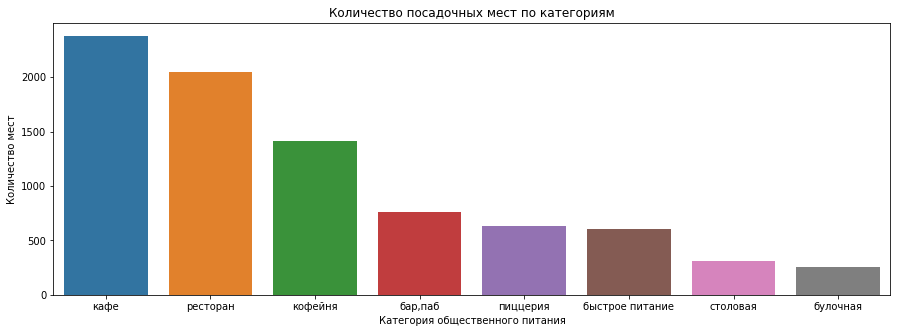

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(x=data_seats.index,y=data_seats['seats'])
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категория общественного питания')
plt.ylabel('Количество мест')
plt.show()

Равно как и в разбивке по категориям выше, так и здесь в распределении посадочных мест в лидерах категории "кафе" и "рестораны". Я предполагаю, что это логично, в эти заведения приходят чтобы поесть, и для этого нужно куда-нибудь сесть. Равно как и категория"булочная" которая у нас заняла последнее место , в ней не так необходимы посадочные места. Продукция в таких заведениях как правило готовится на вынос. 

In [ ]:
# посмотрим теперь на распределение между сетевыми и не сетевыми заведениями
data['chain'].value_counts()

несетевое    5201
сетевое      3205
Name: chain, dtype: int64

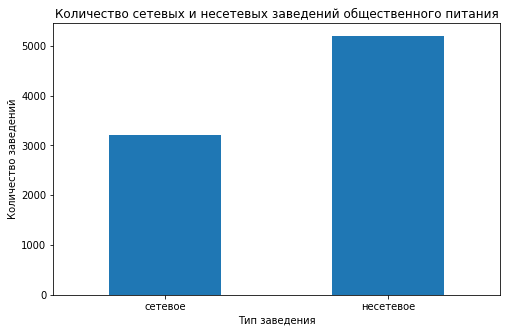

In [ ]:
# уже понятно, что не сетевых заведений больше, визуализируем
ax = data.groupby('chain')['name'].count().sort_values().plot(kind='bar', figsize=(8,5))
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество сетевых и несетевых заведений общественного питания')
plt.xticks(rotation=0)
plt.show()

График нам отчетливо показывает, что несетевых заведений больше. 

In [ ]:
data_chain = data.groupby(['category', 'chain'])['chain'].count()
data_chain.name = 'count'
data_chain = data_chain.reset_index().sort_values(by='count', ascending=False)
data_chain = data_chain[data_chain['chain']=='сетевое'].sort_values(by='count', ascending=False)
data_chain

,category,chain,count
7,кафе,сетевое,779
13,ресторан,сетевое,730
9,кофейня,сетевое,720
11,пиццерия,сетевое,330
5,быстрое питание,сетевое,232
1,"бар,паб",сетевое,169
3,булочная,сетевое,157
15,столовая,сетевое,88


In [ ]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_chain['category'], 
                             values=data_chain['count'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Категории сетевых заведений общественного питания по количеству', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() 

Если взять срез по сетевым заведениям "лидеры" все теже. Среди категорий "Кафе" и "Рестораны" чаще встречаются сетевые чем остальные. Заметно еще категория "Кофейни" которая буквально вровень с "Ресторанами" является тоже в топе по частоте сетевых заведений.

In [ ]:
df_top15 = data[data['chain']=='сетевое']
df_top15 = df_top15.groupby(['name'])['name'].count()
df_top15.name = 'count'
df_top15 = df_top15.reset_index().sort_values(by='count', ascending=False)
df_top15 = df_top15.reset_index()
df_top15= df_top15.loc[:14]
df_top15

,index,name,count
0,729,шоколадница,120
1,335,домино'с пицца,76
2,331,додо пицца,74
3,146,one price coffee,71
4,742,яндекс лавка,69
5,58,cofix,65
6,168,prime,50
7,664,хинкальная,44
8,409,кофепорт,42
9,418,кулинарная лавка братьев караваевых,39


In [ ]:
df_15 = data[data['chain']=='сетевое']
df_15 = df_15.loc[df_15['name'].isin(['шоколадница',
                                      "домино'с пицца", 
                                      'додо пицца', 
                                      'one price coffee', 
                                      'яндекс лавка',
                                      'cofix',
                                      'prime',
                                      'хинкальная',
                                      'кофепорт',
                                      'кулинарная лавка братьев караваевых',
                                      'теремок',
                                      'чайхана',
                                      'cofefest',
                                      'буханка',
                                      'му-му'])]

In [ ]:
# теперь перейдем к топ-15 названий заведений среди сетей
data_top_name = df_15.groupby(['name'])['name'].count()
data_top_name.name = 'count'
data_top_name = data_top_name.reset_index().sort_values(by='count', ascending=False)
data_top_name = data_top_name.reset_index()
data_top_name = data_top_name.loc[:14]
data_top_name

,index,name,count
0,13,шоколадница,120
1,6,домино'с пицца,76
2,5,додо пицца,74
3,2,one price coffee,71
4,14,яндекс лавка,69
5,1,cofix,65
6,3,prime,50
7,11,хинкальная,44
8,7,кофепорт,42
9,8,кулинарная лавка братьев караваевых,39


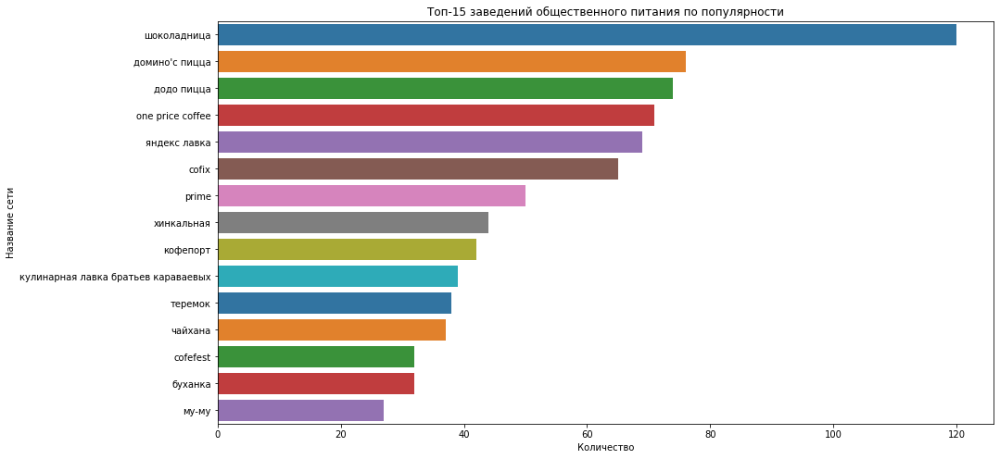

In [ ]:
plt.figure(figsize=(15,8))
ax = sns.barplot(x='count', y='name', data=data_top_name, palette='tab10')
ax.set_xlabel('Количество')
ax.set_ylabel('Название сети')
ax.set_title('Топ-15 заведений общественного питания по популярности')
plt.xticks(rotation=0)
plt.show()

Мы построили график топ-15 названий сетевых заведений общественного питания. На первом месте по количеству записей с больщим отрывом у нас "Шоколадница". Далее в примерно в одном диапазоне идут "Доминос пицца", "Додо пицца", "One price coffee", "Яндекс лавка", и "Cofix". На последнем месте оказалась сеть под названием "Му-Му". Вообще все сети довольно известные, кто-то на рынке ресторанного бизнеса очень давно. Из этого списка выбивается только "Хинкальная" и "Буханка", которые по моему субъективному мнению менее известны. По объединяющему признаку я бы смотрел дальше исследование. Пока на первый взгляд его нет, есть только субъективное мнение, что все эти заведения по большей степени "студенческие". Это места, куда можно по быстрому забежать, достаточно не плохо перекусить и позволить себе это могут люди как и с большим так и меньшим доходом. 

In [ ]:
# построим датасет для анализа по категориям
data_top15 = df_15.groupby(['category'])['name'].count()
data_top15.name = 'count'
data_top15 = data_top15.reset_index().sort_values(by='count', ascending=False)
data_top15 = data_top15.reset_index()
data_top15 = data_top15.loc[:14]
data_top15

,index,category,count
0,4,кофейня,336
1,6,ресторан,186
2,5,пиццерия,151
3,3,кафе,100
4,1,булочная,25
5,2,быстрое питание,12
6,0,"бар,паб",4
7,7,столовая,2


In [ ]:
# строим диаграмму сначала с категориями
fig = go.Figure(data=[go.Pie(labels=data_top15['category'], 
                             values=data_top15['count'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Категории топ-15 сетевых заведений общественного питания по количеству', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество записей',
                                    showarrow=False)])
fig.show() 

Согласно графику в топе у нас кофейни, их 41% (почти половина). С ростом популярности кофе, как напитка в Москве ничего удивительного, что эта категория самая популярная. Далее по порядку идут ресторан (22%) и пиццерия (18%) . Столовая меньше всего в процентаже (0,2%), меньше процента набрала также категория с баром, пабом. 

In [ ]:
# построим датасет для анализа по районам
data_distr = df_15.groupby(['district'])['name'].count()
data_distr.name = 'count'
data_distr = data_distr.reset_index().sort_values(by='count', ascending=False)
data_distr = data_distr.reset_index()
data_distr = data_distr.loc[:14]
data_distr

,index,district,count
0,5,Центральный административный округ,214
1,8,Южный административный округ,89
2,1,Западный административный округ,88
3,2,Северный административный округ,88
4,3,Северо-Восточный административный округ,85
5,0,Восточный административный округ,80
6,7,Юго-Западный административный округ,70
7,6,Юго-Восточный административный округ,56
8,4,Северо-Западный административный округ,46


In [ ]:
# строим диаграмму сначала с категориями
fig = go.Figure(data=[go.Pie(labels=data_distr['district'], 
                             values=data_distr['count'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Районы топ-15 сетевых заведений общественного питания по количеству записей', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество записей',
                                    showarrow=False)])
fig.show() 

Больше всего популярных заведений разместились в центральном административном округе. Что тоже ничего удивительного. Самая большая проходимость людей, помимо работников и студентов в центре много туристов. Им всем нужно где-то попить кофе и покушать. Далее идет Южный администратиный округ и меньше всего популярных заведений в Северо-Западном административном округе.

In [ ]:
# теперь мы посмотрим общую разбивку по заведениям исходя из районов : 
district = data.pivot_table(index='district', values='name', aggfunc='count').sort_values(
    by='name', ascending=False)
district.reset_index()

,district,name
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


В нашем датасете присутсвуют 9 административных округов, можно сказать классические округи. Отмечу отсутствие Зеленоградского, Новомосковского и Троицкого округов.

In [ ]:
distr = data.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)
percentage_df = data.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})
distr = pd.merge(distr, percentage_df, how='left', on=['district', 'category'])
distr

,district,category,name,percentage
0,Центральный административный округ,ресторан,670,29.88
1,Центральный административный округ,кафе,464,20.70
2,Центральный административный округ,кофейня,428,19.09
3,Центральный административный округ,"бар,паб",364,16.24
4,Юго-Восточный административный округ,кафе,282,39.50
...,...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23,5.62
68,Северо-Западный административный округ,столовая,18,4.40
69,Юго-Западный административный округ,столовая,17,2.40
70,Юго-Восточный административный округ,булочная,13,1.82


In [ ]:
fig = px.bar(percentage_df,\
             x='district',\
             y='percentage',\
             color='category',\
             title='Распределение количества заведений по районам',\
             width=1000,
             height=1200)  # text_auto='',
fig.update_layout(
    title='Типы заведений по районам (в процентах)',
    xaxis_title="Район",
    yaxis_title="Количество",
    xaxis=dict(
        tickmode='array',
        tickvals=percentage_df['district'],
        ticktext=percentage_df['district']
    ),
    legend_title=''
)
fig.show()

Интересно посмотреть на состав заведений по каждому округу. Например если столовых примерно равная доля во всех округах, то ресторанов больше в Центральном и Северо-Западном округах. Так и с кафе - их больше на Юго-восточном округе, а вот баров и пабов точно в Центральном. 

In [ ]:
# посмотрим на распеределение средних рейтингов по категориям заведений.
data_rating = data.groupby(['category'], as_index=False)[['rating']].mean().sort_values(by='rating', ascending=False)
data_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


In [ ]:
fig = px.histogram(data_rating,
                   x='category',
                   y='rating',
                   color='category', 
                   title='Распределение средних рейтингов по категориям заведений',
                   nbins=70, 
                   barmode='overlay')
fig.update_xaxes(title_text='Категория') 
fig.update_yaxes(title_text='Рейтинг')
fig.show() 

Интересно, что у нас средний рейтинг получился плюс минус у всех категорий на одном уровне. Но все равно хочу выделить первое место по среднему рейтингу - категории заведений "бар, паб". И отметить самый низкий рейтинг у категории - "быстрое питание". 

In [ ]:
# приступаем к построению фоновой картограммы (хороплет) со средним рейтингом заведений каждого района
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [ ]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

"Хороплет" показал визуально, что в Центральном административном округе Москвы самый высокий средний рейтинг заведений. Что тоже логично, поскольку там очень большая проходимость и больше всего заведений. Высокая конкуренция + обязанность соответствовать хорошему уровню обслуживания заставляет держать марку. Юго-Восточный административный округ с самым низким рейтингом. Хотя если посмотреть на сам рейтинг - 4,1 из 5 это очень хорошо. 

In [ ]:
# далее отобразим все заведения с помощью кластеров
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m

Построенная карта по кластерам только подтверждает очень высокую плотность по заведениям в Центральном административном округе в г. Москва. 

In [ ]:
# теперь посмотрим на топ-15 улиц и построим график заведений и категорий завдеений размещенных на этих улицах
data_top15 = data.groupby(['street'])['name'].count()
data_top15.name = 'count'
data_top15 = data_top15.reset_index().sort_values(by='count', ascending=False)
data_top15 = data_top15.reset_index()
data_top15= data_top15.loc[:14]
data_top15

,index,street,count
0,1090,проспект Мира,184
1,773,Профсоюзная улица,122
2,1087,проспект Вернадского,108
3,525,Ленинский проспект,107
4,523,Ленинградский проспект,95
5,373,Дмитровское шоссе,88
6,455,Каширское шоссе,77
7,298,Варшавское шоссе,76
8,524,Ленинградское шоссе,70
9,550,МКАД,65


In [ ]:
data_15 = data.loc[data['street'].isin(['проспект Мира',
                                        'Профсоюзная улица',
                                        'проспект Вернадского',
                                        'Ленинский проспект',
                                        'Ленинградский проспект',
                                        'Дмитровское шоссе',
                                        'Каширское шоссе',
                                        'Варшавское шоссе',
                                        'Ленинградское шоссе',
                                        'МКАД',
                                        'Люблинская улица',
                                        'улица Вавилова',
                                        'Кутузовский проспект',
                                        'улица Миклухо-Маклая',
                                        'Пятницкая улица'])]

top_15_street = data_15.groupby(['street', 'category'])['name'].count()
top_15_street.name = 'count'
top_15_street = top_15_street.reset_index().sort_values(by='count', ascending=False)
top_15_street = top_15_street.reset_index()

fig = px.bar(top_15_street, 
             x='street', 
             y='count', 
             color='category', 
             title='Общее количество заведений и количество заведений каждой категории по топ-15 улицам', 
             labels=dict(count ='Количество заведений', street='Улицы'))
fig.update_xaxes(tickangle=50)
fig.show()

Больше всего заведений на улице проспект Мира, далее на Профсоюзной улице и на проспекте Вернадского. А вот на Пятницкой улице меньше всего. Полезная информация для прогулок в зиму, на Пятницкой улице будет большая конкуренция за горячим чаем.

In [ ]:
# посмотри на улицы где всего лишь один объект общепита.
one_rest = data.pivot_table(index=['street'],
                                            values='name',  
                                            aggfunc='count').reset_index().query('name == 1')
one_rest

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [ ]:
street_list = list(one_rest['street'])
data_rest_one = data.loc[data['street'].isin(street_list)]
data_rest_one

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевое,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевое,0.0,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевое,0.0,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевое,0.0,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевое,0.0,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,несетевое,90.0,улица Шкулёва,False
8294,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевое,0.0,улица Артюхиной,False
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевое,0.0,Кузьминская улица,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевое,40.0,Новороссийская улица,False


In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_rest_one.apply(create_clusters, axis=1)
m

Эти заведения по большему счету ничем не отличаются от других заведений, кроме как расположением. Они как правило все размещены либо в переулке, либо на улице "спального" района, либо на не длинной улице. В таких местах нет смысла устраивать большую конкуренцию и открывать много заведений.

In [ ]:
# переходим к анализу среднего чека по районам (посчитаем медиану)
med_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
med_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [ ]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=med_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    legend_name='Медианный чек заведений по районам',
).add_to(m)
m

Медианное значение цены получилось самым высоким в Центральном административном округе и в Западном (одинаковое значение).Вообще Западный административный округ считается более дорогим по размещению чем другие, возможно и высокие цены этим же обьясняются. Зато Юго-восточный админстративный округ самый не дорогой (медианное значение всего 450). Наверное зависимость от размещения и удаленность от центра играет роль в образовании цены, все остальные округа по медианному значению ниже чем центр, но выбивается Западный административный округ.

###### Мы провели анализ представленных данных по заведениям общественного питания в г. Москва.  
Определили следующие категории заведений:   
1. кафе  
2. ресторан  
3. кофейня  
4. бар,паб  
5. пиццерия  
6. быстрое питание  
7. столовая  
8. булочная  

Больше всего у нас получилось заведений категорий :  
- "кафе" - 28.3% от общего количества,  
- "ресторан" - 24,3%.  
Получается половина заведений общественного питания - это кафе и рестораны. Меньше всех оказалось булочных - 3,05% и столовых - 3,75%.  

В распределении посадочных мест в лидерах следующие категории:  
- "кафе"  
- "рестораны".  
Меньше всего посадочных мест в категории - "булочная".  

Среди категорий "Кафе" и "Рестораны", а также "Кофейни" чаще встречаются сетевые чем остальные. На их долю приходится около 70% всех сетевых категорий. 

Если выделить топ-15 по популярности сетевых заведений, то:  
- "Шоколадница" - она на первом месте с большим отрывом  
- "Доминос пицца"  
- "Додо пицца"  
- "One price coffee"  
- "Яндекс лавка"  
- "Cofix"  
На последнем месте оказалась сеть под названием - "Му-Му". Все заведения достаточно известные.  

При распределении заведений по категориям сетей:  
- кофейни - 41% (почти половина)  
- ресторан - 22%  
- пиццерия - 18%  
Столовая меньше всего в процентаже - 0,2%, меньше процента набрала также категория с баром, пабом.  

Больше всего популярных заведений разместились:  
- Центральный Административный Округ.  
- Южный Администратиный округ  
Меньше всего популярных заведений в Северо-Западном Административном Округе.  

Если посмотреть на состав заведений по каждому округу, то ресторанов больше в Центральном и Северо-Западном округах. А кафе больше на Юго-восточном округе. Баров и пабов больше размещено в Центральном Административном Округе.  

Стоит отметить, что средний рейтинг заведений получился на одном уровне у всех категорий заведений. Самый высокий средний рейтинг имеет категория заведений "бар, паб". А самый низкий рейтинг у категории - "быстрое питание".  
 
При определениии топ-15 улиц по количеству заведений больше всего объектов размещается на следующих улицах:  
- улице проспект Мира  
- Профсоюзная улица  
- проспект Вернадского.  
На Пятницкой улице меньше всего размещено объектов общественного питания.  

При определении медианного значения цены у Центрального Административного Округа выявлено самое высокое значение. Также в Западном Административном округе было определено такое же медианное значение цены как и у ЦАО.  
Юго-восточный админстративный округ стал самым не дорогим (его медианное значение всего 450).  
Можно предположить взаимосвязь определения цены и удаленности от центра. Остальные округа по медианному значению цены ниже чем в ЦАО.  

Таким образом проведена большая аналитическая работа по исследованию заведений общественного питания Москвы. В ходе исследования получена полезная информация по размещению заведений в округах, медианным значениям цен, анализу разделения заведений на сетевые и несетевые, и т.д.

### Открытие кофейни

In [ ]:
# посчитаем кофейни и посмотрим в каких районах их больше всего.
data_coff = data[data['category'] == 'кофейня']
data_coff['name'].value_counts().sum()

1413

In [ ]:
data_coff.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,0.0,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевое,0.0,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевое,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевое,0.0,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевое,0.0,улица Дыбенко,False
53,royal coffee,кофейня,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880622,37.448529,3.1,NaN,NaN,NaN,NaN,несетевое,148.0,Правобережная улица,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевое,0.0,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевое,0.0,ландшафтный заказник Лианозовский,False
64,testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,несетевое,0.0,Лианозовский парк культуры и отдыха,False
66,молинари,кофейня,"Москва, Алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.887887,37.588294,4.8,NaN,NaN,NaN,NaN,несетевое,120.0,Алтуфьевское шоссе,False


In [ ]:
data_coff_distr = data_coff.groupby(['district'])['name'].count()
data_coff_distr.name = 'count'
data_coff_distr = data_coff_distr.reset_index().sort_values(by='count', ascending=False)
data_coff_distr = data_coff_distr.reset_index()
data_coff_distr

,index,district,count
0,5,Центральный административный округ,428
1,2,Северный административный округ,193
2,3,Северо-Восточный административный округ,159
3,1,Западный административный округ,150
4,8,Южный административный округ,131
5,0,Восточный административный округ,105
6,7,Юго-Западный административный округ,96
7,6,Юго-Восточный административный округ,89
8,4,Северо-Западный административный округ,62


In [ ]:
fig = go.Figure(data=[go.Pie(labels=data_coff_distr['district'], 
                             values=data_coff_distr['count'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Распределение кофеен по районам', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество кофеен',
                                    showarrow=False)])
fig.show() 

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_coff.apply(create_clusters, axis=1)
m

Всего у нас получается 1413 кофеен в Москве, большинство из них находятся в ЦАО (ожидаемо) - 30% от всего количества. Дальше распределение идет на убыль, меньше всего кофеен на Северо-Западе - 4,39%. Отмечу, что чем ближе к центру размещение плотнее и встречаются кофейни все чаще. А вот в спальных районах уже меньше плотность , и вариантов куда зайти меньше. Этот момент нужно зафиксировать - большинство живут в спальных районах, они ездят на работу с утра на общественном транспорте и утром могут забегать за кофе. Также вчерами или в выходной день им возможно хотелось бы просто зайти и провести время в уютном месте с ароматном запахом кофе. Выбор не так велик на Северо-западе, Юго-Востоке, Юго-Западе. 

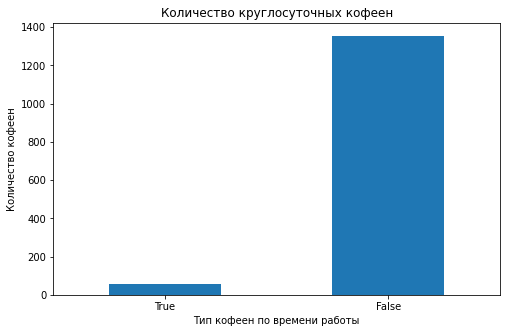

In [ ]:
# теперь посмотрим также только с круглосуточными кофейнями.
ax = data_coff.groupby('is_24/7')['name'].count().sort_values().plot(kind='bar', figsize=(8,5))
ax.set_xlabel('Тип кофеен по времени работы')
ax.set_ylabel('Количество кофеен')
ax.set_title('Количество круглосуточных кофеен')
plt.xticks(rotation=0)
plt.show()

In [ ]:
data_coff['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

Всего 59 круглосуточных заведений на всю Москву! Давайте посмотрим где они размещены.

In [ ]:
data_coff_24 = data_coff[data_coff['is_24/7'] == 'True']
data_coff_24_7 = data_coff_24.groupby(['district'])['name'].count()
data_coff_24_7.name = 'count'
data_coff_24_7 = data_coff_24_7.reset_index().sort_values(by='count', ascending=False)
fig = go.Figure(data=[go.Pie(labels=data_coff_24_7['district'], 
                             values=data_coff_24_7['count'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Распределение кофеен по районам', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Количество кофеен',
                                    showarrow=False)])
fig.show() 

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_coff_24.apply(create_clusters, axis=1)
m

Круглосуточные кофейни ожидаемо размещены в ЦАО, на втором месте Западный административный округ. А вот в Юго-Восточном и Южном административном округе вообще по одной круглосуточной кофейни на весь район.

In [ ]:
# смотрим рейтинги кофеен
rating_coff = data_coff.groupby(['name'], as_index=False)[['rating']].mean().sort_values(by='rating', ascending=False)
rating_coff

,name,rating
698,подоконник,5.0
585,кофейная история,5.0
725,саббиа кофе,5.0
404,youtime,5.0
96,coffee drop,5.0
...,...,...
197,gold,3.0
141,coffprice,3.0
808,шкафе бульон,2.9
281,monty cafe,2.3


In [ ]:
rating_distr = data_coff.groupby('district', as_index=False)['rating'].agg('mean')
rating_distr.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [ ]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_distr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)
m

Здесь не при сильном разбросе между средними рейтингами всех округов (от 4,19 до 4,33) все равно выделяется опять ЦАО и еще Северо-Западный административные округа. А вот кофейни с самыми низкими средними рейтингами находятся у нас ЮВАО, СВАО и ЗАО. 

In [ ]:
# посмотрим на среднюю цену чашки кофе и будем переходить уже к выводам
mean_district = data_coff.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')
mean_district.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
0,Восточный административный округ,174.023810
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,151.088235


In [ ]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=mean_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    legend_name='Cредний чек за чашку кофе по районам',
).add_to(m)
m

Интересно, при самых низких средних рейтингах кофеен в ЗАО самая дорогая средняя стоимость кружки кофе - 189. ЦАО тоже в лидерах на втором месте по дороговизне - 187. Самое дешевая средняя цена на Юго-Востоке - 151 за чашку кофе. Конкретно по стоимости отвечу ниже в итоговом выводе.

###### Итог:  
Всего 1413 кофеен в Москве, из них большинство находятся в ЦАО - 30%. Меньше всего кофеен на Северо-Западе - 4,39%. Также достаточно маленькая плотность на Юго-Востоке и Юго-Западе.  
Из этих 1413 кофеен только 59 работают круглосуточно. Большинство размещены в ЦАО (26 кофеен) , на втором месте Западный административный округ (9 кофеен). В Юго-Восточном и Южном административном округе только по одной круглосуточной кофейни на весь район.  
Самый высокий средний рейтинг у кофеен из ЦАО и СЗАО. А вот кофейни с самыми низкими средними рейтингами находятся в ЮВАО, СВАО и ЗАО.
По средней стоимости за чашку кофе в ЗАО самая дорогая средняя стоимость кружки кофе - 189. Самое дешевая средняя цена на Юго-Востоке - 151 за чашку кофе.  
Виден опеределенный перекос в количестве и качестве на ЦАО. Выходить на рынок при такой конкуренции можно, но нужна оценка финансовых консультантов, на сколько сильно можно демпинговать стоимость кружки кофе (в ЦАО одна из самых дорогих - 187). Если есть возможность опуститься до 165 и началь агресивно завоеовывать рынок - то Welcome! Но это высокий риск. 
Зато благодаря этому мини исследованию у нас открывается пусть и не голубой океан, но не плохая ниша - в ЮВАО наименьшая плотность по количеству кофеен, а круглосуточная вообще одна, и там же одни из самых низких рейтингов среди всех округов.
Если сделать кофейню с определенным стилем и хорошим обслуживанием, поставить на круглосуточный режим - она уже будет смотреться выйгрышно. Определенно аренда помещении будет явно дешевле чем в ЦАО и тем самым можно при меньших издержках и хорошем сервисе поставить цену чуть выше - в диапазоне 155-160 рублей. Если у людей будет хорошая кофейня рейтинга уровня ЦАО при выборе из двух (ночных) и разнице в 4 рубля за кофе они пойдут в ту где будут знать , что их хорошо обслужат. 

### Ссылка на презентацию

https://disk.yandex.ru/i/zroeOnUOso7R4A